# Airline Customer Satisfaction: Classification Project

# Data Preparation

### Import Necessary Packages

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import pylab
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
import graphviz
from collections import Counter
from sklearn.metrics import roc_auc_score
from sklearn import datasets, linear_model
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn import datasets, metrics, model_selection, svm
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix,classification_report,f1_score

### Load data and store into Panda DataFrame objects

In [2]:
df = pd.read_excel (r'/Users/sarahlueling/Desktop/Intro to ML/satisfaction_2015.xlsx')
print (df)

            id satisfaction_v2  Gender      Customer Type  Age  \
0       117135       satisfied    Male  disloyal Customer   56   
1        72091       satisfied    Male  disloyal Customer   49   
2        29663       satisfied    Male  disloyal Customer   55   
3        81849       satisfied  Female  disloyal Customer   36   
4        83693       satisfied    Male  disloyal Customer   55   
...        ...             ...     ...                ...  ...   
129875   49202       satisfied  Female     Loyal Customer   35   
129876   16986       satisfied  Female     Loyal Customer   11   
129877   50316       satisfied    Male     Loyal Customer   46   
129878   22333       satisfied  Female     Loyal Customer   35   
129879   10198       satisfied  Female     Loyal Customer   47   

         Type of Travel     Class  Flight Distance  Inflight wifi service  \
0       Personal Travel       Eco              369                      0   
1       Personal Travel       Eco             2486   

In [3]:
pd.DataFrame(df)

,id,satisfaction_v2,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
0,117135,satisfied,Male,disloyal Customer,56,Personal Travel,Eco,369,0,2,...,3,3,1,5,3,3,4,3,0,0.0
1,72091,satisfied,Male,disloyal Customer,49,Personal Travel,Eco,2486,0,2,...,3,2,1,1,4,4,3,2,0,0.0
2,29663,satisfied,Male,disloyal Customer,55,Personal Travel,Eco,1448,0,3,...,3,3,3,5,3,2,3,3,0,0.0
3,81849,satisfied,Female,disloyal Customer,36,Personal Travel,Eco,1501,0,4,...,4,4,5,4,5,5,5,4,0,0.0
4,83693,satisfied,Male,disloyal Customer,55,Personal Travel,Eco,577,0,5,...,3,3,3,4,5,3,4,3,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,49202,satisfied,Female,Loyal Customer,35,Business travel,Business,2592,5,5,...,4,5,5,5,5,5,5,4,0,0.0
129876,16986,satisfied,Female,Loyal Customer,11,Business travel,Eco,610,5,1,...,5,5,5,4,1,2,5,5,82,65.0
129877,50316,satisfied,Male,Loyal Customer,46,Business travel,Business,86,1,1,...,5,5,1,3,1,5,2,2,0,0.0
129878,22333,satisfied,Female,Loyal Customer,35,Business travel,Business,83,1,1,...,5,5,4,4,2,5,5,5,0,0.0


## Dataset Information

In [4]:
# preview the top-5 rows of the data

In [5]:
df.head(15)

,id,satisfaction_v2,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
0,117135,satisfied,Male,disloyal Customer,56,Personal Travel,Eco,369,0,2,...,3,3,1,5,3,3,4,3,0,0.0
1,72091,satisfied,Male,disloyal Customer,49,Personal Travel,Eco,2486,0,2,...,3,2,1,1,4,4,3,2,0,0.0
2,29663,satisfied,Male,disloyal Customer,55,Personal Travel,Eco,1448,0,3,...,3,3,3,5,3,2,3,3,0,0.0
3,81849,satisfied,Female,disloyal Customer,36,Personal Travel,Eco,1501,0,4,...,4,4,5,4,5,5,5,4,0,0.0
4,83693,satisfied,Male,disloyal Customer,55,Personal Travel,Eco,577,0,5,...,3,3,3,4,5,3,4,3,0,0.0
5,129488,neutral or dissatisfied,Female,disloyal Customer,15,Personal Travel,Eco,2704,1,0,...,1,1,5,3,5,5,5,1,0,0.0
6,69507,neutral or dissatisfied,Male,disloyal Customer,51,Personal Travel,Eco,1746,1,0,...,1,1,5,3,5,4,4,1,20,22.0
7,126309,neutral or dissatisfied,Female,disloyal Customer,26,Personal Travel,Eco,650,1,1,...,2,2,2,5,2,1,3,2,0,0.0
8,123581,neutral or dissatisfied,Female,disloyal Customer,37,Personal Travel,Eco,1773,1,1,...,2,2,2,5,3,3,3,2,5,4.0
9,24129,neutral or dissatisfied,Female,disloyal Customer,65,Personal Travel,Eco,584,1,1,...,4,4,3,4,4,4,3,4,0,13.0


In [6]:
len(df)

129880

In [7]:
list(df.columns)

['id',
 'satisfaction_v2',
 'Gender',
 'Customer Type',
 'Age',
 'Type of Travel',
 'Class',
 'Flight Distance',
 'Inflight wifi service',
 'Departure/Arrival time convenient',
 'Ease of Online booking',
 'Gate location',
 'Food and drink',
 'Online boarding',
 'Seat comfort',
 'Inflight entertainment',
 'On-board service',
 'Leg room service',
 'Baggage handling',
 'Checkin service',
 'Inflight service',
 'Cleanliness',
 'Departure Delay in Minutes',
 'Arrival Delay in Minutes']

Some names aren't very clear. We will clean this in next section.

In [8]:
#Get basic info about the features

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 24 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   id                                 129880 non-null  int64  
 1   satisfaction_v2                    129880 non-null  object 
 2   Gender                             129880 non-null  object 
 3   Customer Type                      129880 non-null  object 
 4   Age                                129880 non-null  int64  
 5   Type of Travel                     129880 non-null  object 
 6   Class                              129880 non-null  object 
 7   Flight Distance                    129880 non-null  int64  
 8   Inflight wifi service              129880 non-null  int64  
 9   Departure/Arrival time convenient  129880 non-null  int64  
 10  Ease of Online booking             129880 non-null  int64  
 11  Gate location                      1298

We need to put this into numeric data to be able to use specific classifiers. Thus, we will pre-process data for the following rows. sex, chest_pain_type, fasting_blood_sugar, rest_ecg, exercise_induced_angina, exercise_induced_angina, slope, vessels_colored_by_flourosopy, thalassemia

No missing data so we don't have to replace an observation points

In [10]:
# Generate descriptive statistics of each numerical feature

In [11]:
df.describe()

,id,Age,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes
count,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129487.000000
mean,64940.500000,39.427957,1190.316392,2.728696,3.057599,2.756876,2.976925,3.204774,3.252633,3.441361,3.358077,3.383023,3.350878,3.632114,3.306267,3.642193,3.286326,14.713713,15.091129
std,37493.270818,15.119360,997.452477,1.329340,1.526741,1.401740,1.278520,1.329933,1.350719,1.319289,1.334049,1.287099,1.316252,1.180025,1.266185,1.176669,1.313682,38.071126,38.465650
min,1.000000,7.000000,31.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32470.750000,27.000000,414.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,64940.500000,40.000000,844.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,97410.250000,51.000000,1744.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,129880.000000,85.000000,4983.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


In [12]:
df['satisfaction_v2'].value_counts()

neutral or dissatisfied    73452
satisfied                  56428
Name: satisfaction_v2, dtype: int64

# Data Cleaning

## Rename Features

Rename to make the data easier to understand (e.g. caplock each word, and lower case the rest)

In [13]:
df.columns = ['id',
 'Satisfaction',
 'Gender',
 'Customer_type',
 'Age',
 'Type_of_travel',
 'Class',
 'Flight distance',
 'Inflight wifi service',
 'Departure/arrival time convenient',
 'Ease of online booking',
 'Gate location',
 'Food and drink',
 'Online boarding',
 'Seat comfort',
 'Inflight entertainment',
 'On-board service',
 'Leg room service',
 'Baggage handling',
 'Checkin service',
 'Inflight service',
 'Cleanliness',
 'Departure delay in minutes',
 'Arrival delay in minutes']

In [14]:
list(df.columns)

['id',
 'Satisfaction',
 'Gender',
 'Customer_type',
 'Age',
 'Type_of_travel',
 'Class',
 'Flight distance',
 'Inflight wifi service',
 'Departure/arrival time convenient',
 'Ease of online booking',
 'Gate location',
 'Food and drink',
 'Online boarding',
 'Seat comfort',
 'Inflight entertainment',
 'On-board service',
 'Leg room service',
 'Baggage handling',
 'Checkin service',
 'Inflight service',
 'Cleanliness',
 'Departure delay in minutes',
 'Arrival delay in minutes']

## Dropping unnecessary fields

In [15]:
df = df.drop(['id'], axis=1)

In [16]:
list(df.columns)

['Satisfaction',
 'Gender',
 'Customer_type',
 'Age',
 'Type_of_travel',
 'Class',
 'Flight distance',
 'Inflight wifi service',
 'Departure/arrival time convenient',
 'Ease of online booking',
 'Gate location',
 'Food and drink',
 'Online boarding',
 'Seat comfort',
 'Inflight entertainment',
 'On-board service',
 'Leg room service',
 'Baggage handling',
 'Checkin service',
 'Inflight service',
 'Cleanliness',
 'Departure delay in minutes',
 'Arrival delay in minutes']

In [17]:
# Check for missing data

In [18]:
print(df.isnull().sum())

Satisfaction                           0
Gender                                 0
Customer_type                          0
Age                                    0
Type_of_travel                         0
Class                                  0
Flight distance                        0
Inflight wifi service                  0
Departure/arrival time convenient      0
Ease of online booking                 0
Gate location                          0
Food and drink                         0
Online boarding                        0
Seat comfort                           0
Inflight entertainment                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Inflight service                       0
Cleanliness                            0
Departure delay in minutes             0
Arrival delay in minutes             393
dtype: int64


In [19]:
#There are 393 missing observations for 'Arrival delay in minutes'. Since the overall dataset is big enough we will keep this feature and fill in with the mean

In [20]:
df['Arrival delay in minutes'].fillna(df['Arrival delay in minutes'].mean(), inplace=True)

In [21]:
print(df.isnull().sum())

Satisfaction                         0
Gender                               0
Customer_type                        0
Age                                  0
Type_of_travel                       0
Class                                0
Flight distance                      0
Inflight wifi service                0
Departure/arrival time convenient    0
Ease of online booking               0
Gate location                        0
Food and drink                       0
Online boarding                      0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
Cleanliness                          0
Departure delay in minutes           0
Arrival delay in minutes             0
dtype: int64


# Data Preprocessing

We need to encode target labels with value between 0 and n_classes-1 so that the computer can understand the values when creating specific classifiers.

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Satisfaction                       129880 non-null  object 
 1   Gender                             129880 non-null  object 
 2   Customer_type                      129880 non-null  object 
 3   Age                                129880 non-null  int64  
 4   Type_of_travel                     129880 non-null  object 
 5   Class                              129880 non-null  object 
 6   Flight distance                    129880 non-null  int64  
 7   Inflight wifi service              129880 non-null  int64  
 8   Departure/arrival time convenient  129880 non-null  int64  
 9   Ease of online booking             129880 non-null  int64  
 10  Gate location                      129880 non-null  int64  
 11  Food and drink                     1298

In [23]:
le_Satisfaction = LabelEncoder()
le_Gender = LabelEncoder()
le_Customer_type = LabelEncoder()
le_Type_of_travel = LabelEncoder()
le_Class = LabelEncoder()

In [24]:
df['Satisfaction_n'] = le_Satisfaction.fit_transform(df['Satisfaction'])
df['Gender_n'] = le_Gender.fit_transform(df['Gender'])
df['Customer_type_n'] = le_Customer_type.fit_transform(df['Customer_type'])
df['Type_of_travel_n'] = le_Type_of_travel.fit_transform(df['Type_of_travel'])
df['Class_n'] = le_Class.fit_transform(df['Class'])


df.head()

,Satisfaction,Gender,Customer_type,Age,Type_of_travel,Class,Flight distance,Inflight wifi service,Departure/arrival time convenient,Ease of online booking,...,Checkin service,Inflight service,Cleanliness,Departure delay in minutes,Arrival delay in minutes,Satisfaction_n,Gender_n,Customer_type_n,Type_of_travel_n,Class_n
0,satisfied,Male,disloyal Customer,56,Personal Travel,Eco,369,0,2,0,...,3,4,3,0,0.0,1,1,1,1,1
1,satisfied,Male,disloyal Customer,49,Personal Travel,Eco,2486,0,2,1,...,4,3,2,0,0.0,1,1,1,1,1
2,satisfied,Male,disloyal Customer,55,Personal Travel,Eco,1448,0,3,0,...,2,3,3,0,0.0,1,1,1,1,1
3,satisfied,Female,disloyal Customer,36,Personal Travel,Eco,1501,0,4,0,...,5,5,4,0,0.0,1,0,1,1,1
4,satisfied,Male,disloyal Customer,55,Personal Travel,Eco,577,0,5,0,...,3,4,3,0,0.0,1,1,1,1,1


Drop the old columns with string values

In [25]:
df = df.drop(columns=['Satisfaction' , 'Gender' , 'Customer_type' , 'Type_of_travel' , 'Class'])

Now rename the columns back to the original name

In [26]:
df.rename({"Satisfaction_n": "Satisfaction", 
           "Gender_n": "Gender", 
           "Customer_type_n": "Customer_type",
           "Type_of_travel_n": "Type_of_travel", 
           "Class_n": "Class"}, 
          axis = "columns", inplace = True)
df.head()

,Age,Flight distance,Inflight wifi service,Departure/arrival time convenient,Ease of online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,...,Checkin service,Inflight service,Cleanliness,Departure delay in minutes,Arrival delay in minutes,Satisfaction,Gender,Customer_type,Type_of_travel,Class
0,56,369,0,2,0,4,3,0,3,3,...,3,4,3,0,0.0,1,1,1,1,1
1,49,2486,0,2,1,4,2,1,3,2,...,4,3,2,0,0.0,1,1,1,1,1
2,55,1448,0,3,0,4,3,0,3,3,...,2,3,3,0,0.0,1,1,1,1,1
3,36,1501,0,4,0,3,4,0,4,4,...,5,5,4,0,0.0,1,0,1,1,1
4,55,577,0,5,0,3,3,5,3,3,...,3,4,3,0,0.0,1,1,1,1,1


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Age                                129880 non-null  int64  
 1   Flight distance                    129880 non-null  int64  
 2   Inflight wifi service              129880 non-null  int64  
 3   Departure/arrival time convenient  129880 non-null  int64  
 4   Ease of online booking             129880 non-null  int64  
 5   Gate location                      129880 non-null  int64  
 6   Food and drink                     129880 non-null  int64  
 7   Online boarding                    129880 non-null  int64  
 8   Seat comfort                       129880 non-null  int64  
 9   Inflight entertainment             129880 non-null  int64  
 10  On-board service                   129880 non-null  int64  
 11  Leg room service                   1298

All values are numeric now

In [28]:
df.head()

,Age,Flight distance,Inflight wifi service,Departure/arrival time convenient,Ease of online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,...,Checkin service,Inflight service,Cleanliness,Departure delay in minutes,Arrival delay in minutes,Satisfaction,Gender,Customer_type,Type_of_travel,Class
0,56,369,0,2,0,4,3,0,3,3,...,3,4,3,0,0.0,1,1,1,1,1
1,49,2486,0,2,1,4,2,1,3,2,...,4,3,2,0,0.0,1,1,1,1,1
2,55,1448,0,3,0,4,3,0,3,3,...,2,3,3,0,0.0,1,1,1,1,1
3,36,1501,0,4,0,3,4,0,4,4,...,5,5,4,0,0.0,1,0,1,1,1
4,55,577,0,5,0,3,3,5,3,3,...,3,4,3,0,0.0,1,1,1,1,1


In [29]:
#Standardize scale: I will perform a standardization (linear transformation that reduces all values to zero mean and one standard deviation) of all quantitative features

In [30]:
sc = StandardScaler()
col_to_scale = ['Age', 'Flight distance', 'Departure/arrival time convenient', 'Gate location', 'Food and drink', 'Seat comfort', 'Online boarding',  'Inflight entertainment', 'On-board service', 'Leg room service', 'Baggage handling', 'Checkin service', 'Inflight service', 'Cleanliness', 'Departure delay in minutes', 'Arrival delay in minutes']
df[col_to_scale] = sc.fit_transform(df[col_to_scale])

# Model Training and evaluation

## Create Target and Feature Data

In [31]:
X = df.drop(['Satisfaction'],axis='columns')
X.head(5)

,Age,Flight distance,Inflight wifi service,Departure/arrival time convenient,Ease of online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,...,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure delay in minutes,Arrival delay in minutes,Gender,Customer_type,Type_of_travel,Class
0,1.096085,-0.823417,0,-0.692719,0,0.800206,-0.153973,-2.408085,-0.334546,-0.268414,...,-0.535681,-0.241883,0.304086,-0.217958,-0.386481,-0.392924,1,1,1,1
1,0.633101,1.298998,0,-0.692719,1,0.800206,-0.905894,-1.667736,-0.334546,-1.018015,...,0.311762,0.547894,-0.545774,-0.979180,-0.386481,-0.392924,1,1,1,1
2,1.029945,0.258343,0,-0.037727,0,0.800206,-0.153973,-2.408085,-0.334546,-0.268414,...,-0.535681,-1.031660,-0.545774,-0.217958,-0.386481,-0.392924,1,1,1,1
3,-0.226727,0.311478,0,0.617265,0,0.018048,0.597947,-2.408085,0.423441,0.481186,...,1.159206,1.337671,1.153946,0.543264,-0.386481,-0.392924,0,1,1,1
4,1.029945,-0.614885,0,1.272257,0,0.018048,-0.153973,1.293662,-0.334546,-0.268414,...,1.159206,-0.241883,0.304086,-0.217958,-0.386481,-0.392924,1,1,1,1


In [32]:
y = pd.DataFrame(df, columns = ['Satisfaction'])
y.head(5)

,Satisfaction
0,1
1,1
2,1
3,1
4,1


In [33]:
type(X), X.shape

(pandas.core.frame.DataFrame, (129880, 22))

In [34]:
type(y), y.shape

(pandas.core.frame.DataFrame, (129880, 1))

## Create Test and Training Data

In [35]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X , y,test_size=0.3,random_state=42)

In [36]:
X_train.shape

(90916, 22)

In [37]:
X_test.shape

(38964, 22)

In [38]:
y_train.shape

(90916, 1)

In [39]:
y_test.shape

(38964, 1)

# Machine Learning Models

# KNN Classification

In [40]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train.values.ravel())

KNeighborsClassifier()

In [41]:
y_pred_knn = knn.predict(X_test)
knn_score = accuracy_score(y_test, y_pred_knn)
knn_score

0.9307822605481983

### Compare results for accuracy

In [42]:
y_pred_knn

array([0, 0, 1, ..., 0, 0, 1])

In [43]:
y_test_v = y_test.values.reshape(1,len(y_test))[0]
y_test_v

array([1, 0, 1, ..., 1, 0, 1])

In [44]:
y_pred_knn == y_test_v

array([False,  True,  True, ..., False,  True,  True])

# Decision Tree Classification

In [45]:
from sklearn.tree import DecisionTreeClassifier


In [46]:
cart = DecisionTreeClassifier(random_state = 42)
cart_model = cart.fit(X_train, y_train)

In [47]:
y_pred_cart = cart_model.predict(X_test)
cart1 = accuracy_score(y_test, y_pred_cart)
cart1

0.9457191253464736

### Compare results for accuracy

In [48]:
y_pred_cart

array([0, 0, 1, ..., 0, 0, 0])

In [49]:
y_test_v = y_test.values.reshape(1,len(y_test))[0]
y_test_v

array([1, 0, 1, ..., 1, 0, 1])

In [50]:
y_pred_cart == y_test_v

array([False,  True,  True, ..., False,  True, False])

# Logistic Regression

In [51]:
from sklearn.linear_model import LogisticRegression

model_1 = LogisticRegression(random_state=42)
lr = model_1.fit(X_train, y_train.values.ravel())
lra=model_1.score(X_test, y_test)
y_pred_lr=model_1.predict(X_test)

In [52]:
y_pred_lr=model_1.predict(X_test)
lr_score = accuracy_score(y_test, y_pred_lr)
lr_score

0.8733189610922903

### Compare results for accuracy

In [53]:
y_pred_lr = lr.predict(X_test)
y_pred_lr

array([1, 0, 1, ..., 0, 1, 0])

In [54]:
y_test_z = y_test.values.reshape(1,len(y_test))[0]
y_test_z

array([1, 0, 1, ..., 1, 0, 1])

In [55]:
y_test_z==y_pred_lr

array([ True,  True,  True, ..., False, False, False])

### Compare 3 models

In [56]:
accuracy = [knn_score, cart1, lra]
algorithm_models = ['K-Nearest Neighbors', 'CART', 'Logistical Regression']

score_df = pd.DataFrame({'Algorithms': algorithm_models, 'Accuracy_Score': accuracy})
score_df.style.background_gradient(cmap="YlGnBu",high=1,axis=0)

,Algorithms,Accuracy_Score
0,K-Nearest Neighbors,0.930782
1,CART,0.945719
2,Logistical Regression,0.873319


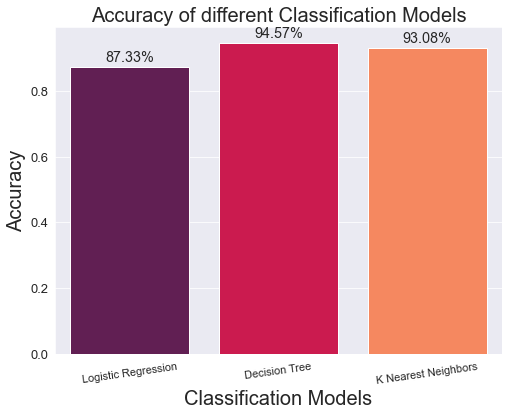

In [57]:
mylist=[]
mylist2=[]
mylist.append(lra)
mylist2.append("Logistic Regression")
mylist.append(cart1)
mylist2.append("Decision Tree")
mylist.append(knn_score)
mylist2.append("K Nearest Neighbors")
plt.rcParams['figure.figsize']=8,6
sns.set_style("darkgrid")
ax = sns.barplot(x=mylist2, y=mylist, palette = "rocket", saturation =1.5)
plt.xlabel("Classification Models", fontsize = 20 )
plt.ylabel("Accuracy", fontsize = 20)
plt.title("Accuracy of different Classification Models", fontsize = 20)
plt.xticks(fontsize = 11, horizontalalignment = 'center', rotation = 8)
plt.yticks(fontsize = 13)
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.annotate(f'{height:.2%}', (x + width/2, y + height*1.02), ha='center', fontsize = 'x-large')
plt.show()

## Create Tree to see the extent of pruning

In [58]:
import graphviz
from sklearn import tree

In [59]:
dot_data = tree.export_graphviz(cart_model, out_file= None,  
                               feature_names=['Gender','Customer_type','Age','Type_of_travel','Class','Flight distance','Inflight wifi service','Departure/arrival time convenient','Ease of online booking','Gate location','Food and drink','Online boarding','Seat comfort','Inflight entertainment','On-board service','Leg room service','Baggage handling','Checkin service','Inflight service','Cleanliness','Departure delay in minutes','Arrival delay in minutes'],
                               class_names = ['satisfied','not satisfied'],
                               filled = True, rounded=True, 
                               special_characters=True)
graph = graphviz.Source(dot_data)
graph

## Result analysis

What is the difference if you change the size of the training data and parameters.
What is the ideal test size for data (Training and test data)

# Model interpretation

## Decision Tree Classification

<AxesSubplot:>

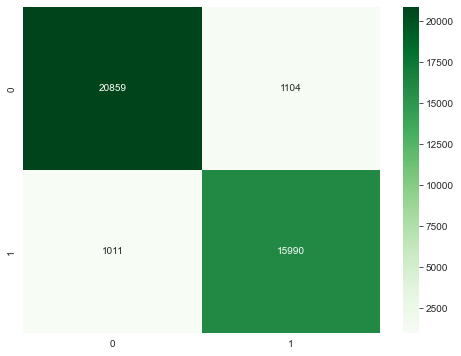

In [60]:
sns.heatmap(confusion_matrix(y_test, y_pred_cart),cmap='Greens',annot=True,fmt='.0f')

In [61]:
print(classification_report(y_test,y_pred_cart))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95     21963
           1       0.94      0.94      0.94     17001

    accuracy                           0.95     38964
   macro avg       0.94      0.95      0.94     38964
weighted avg       0.95      0.95      0.95     38964



In [62]:
f1_score(y_test,y_pred_cart,average='weighted')

0.9457355720047882

In [63]:
from sklearn.metrics import roc_auc_score
print( F'Roc Auc Score:',roc_auc_score(y_test, cart.predict(X_test)))

Roc Auc Score: 0.9451332763868934


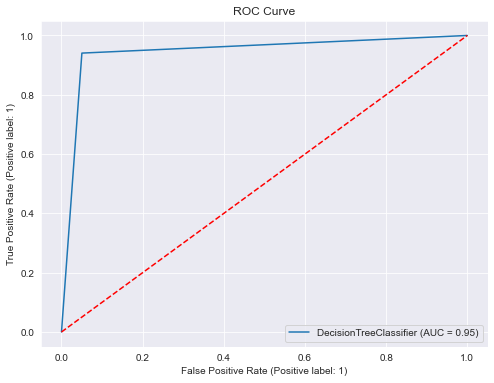

In [64]:
# ROC CURVE
metrics.plot_roc_curve(cart, X_test, y_test)
plt.title('ROC Curve')
plt.plot([0, 1], [0, 1], 'r--')
plt.show()

## Logistic Regression

<AxesSubplot:>

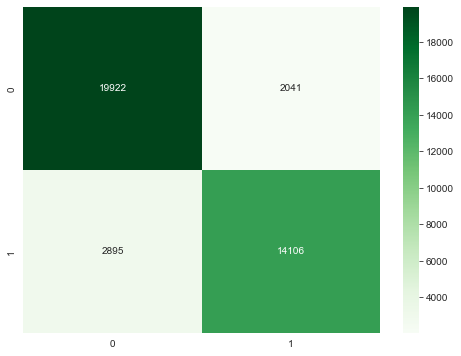

In [65]:
sns.heatmap(confusion_matrix(y_test, y_pred_lr),cmap='Greens',annot=True,fmt='.0f')

In [66]:
print(classification_report(y_test,y_pred_lr))

              precision    recall  f1-score   support

           0       0.87      0.91      0.89     21963
           1       0.87      0.83      0.85     17001

    accuracy                           0.87     38964
   macro avg       0.87      0.87      0.87     38964
weighted avg       0.87      0.87      0.87     38964



In [67]:
f1_score(y_test,y_pred_lr,average='weighted')

0.8728950717811415

In [68]:
from sklearn.metrics import roc_auc_score
print( F'Roc Auc Score:',roc_auc_score(y_test, model_1.predict(X_test)) )

Roc Auc Score: 0.8683934410408265


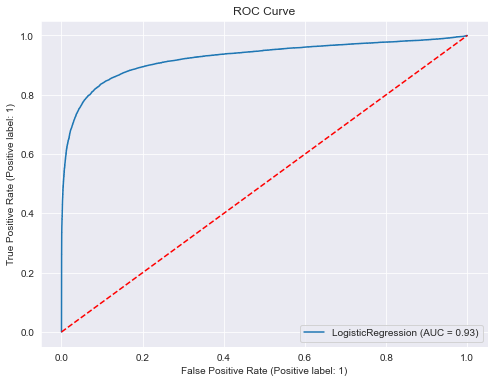

In [69]:
# ROC CURVE
metrics.plot_roc_curve(model_1, X_test, y_test)
plt.title('ROC Curve')
plt.plot([0, 1], [0, 1], 'r--')
plt.show()

## KNN 

<AxesSubplot:>

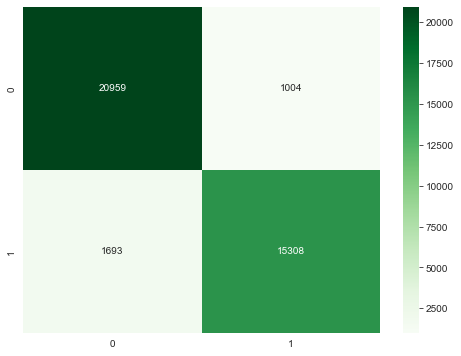

In [70]:
sns.heatmap(confusion_matrix(y_test,y_pred_knn),annot=True,cmap='Greens',fmt='.0f')

In [71]:
print(classification_report(y_test,y_pred_knn))

              precision    recall  f1-score   support

           0       0.93      0.95      0.94     21963
           1       0.94      0.90      0.92     17001

    accuracy                           0.93     38964
   macro avg       0.93      0.93      0.93     38964
weighted avg       0.93      0.93      0.93     38964



In [72]:
f1_score(y_test,y_pred_knn,average='weighted')

0.9306009315346889

In [73]:
print( F'Roc Auc Score:',roc_auc_score(y_test, knn.predict(X_test)))

Roc Auc Score: 0.9273521887449175


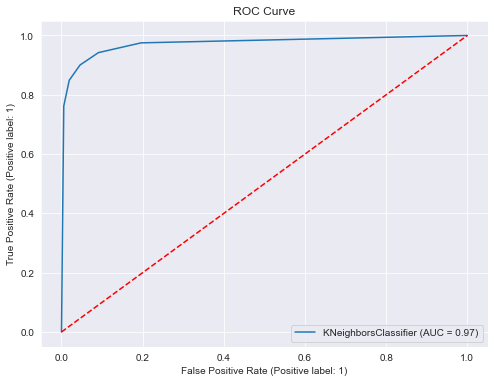

In [74]:
# ROC CURVE
metrics.plot_roc_curve(knn, X_test, y_test)
plt.title('ROC Curve')
plt.plot([0, 1], [0, 1], 'r--')
plt.show()

## Coefficient Analysis

In [75]:
# get Correlation Coefficient for each feature using Logistic Regression
coeff_df = pd.DataFrame(df.columns.delete(0))
coeff_df.columns = ['Features']
coeff_df["Coefficient"] = pd.Series(model_1.coef_[0])

# preview
coeff_df.sort_values(by='Coefficient', inplace=True)
coeff_df

,Features,Coefficient
20,Type_of_travel,-2.843560
19,Customer_type,-2.095128
21,Class,-0.525255
17,Satisfaction,-0.355733
3,Ease of online booking,-0.205089
4,Gate location,-0.149444
0,Flight distance,-0.137294
6,Online boarding,-0.025082
1,Inflight wifi service,-0.007944
5,Food and drink,0.034342


In [76]:
features_name = np.array(df.columns.delete(0).tolist())

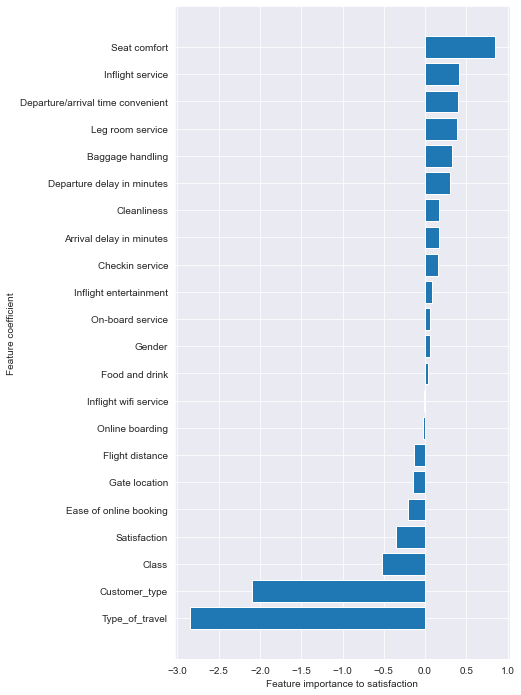

In [77]:
fig, ax = plt.subplots(figsize=(6,12))
l = len(features_name)
ax.barh(range(l), coeff_df.Coefficient)
ax.set_xlabel("Feature importance to satisfaction")
ax.set_ylabel("Feature coefficient")
ax.set_yticks(range(l))
y_lb = ax.set_yticklabels(coeff_df.Features)

### Test with different splitting values: What is the difference if you change the size of the training data and parameters. 

In [78]:
X = df.drop(['Satisfaction'],axis='columns')
X.head(5)

,Age,Flight distance,Inflight wifi service,Departure/arrival time convenient,Ease of online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,...,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure delay in minutes,Arrival delay in minutes,Gender,Customer_type,Type_of_travel,Class
0,1.096085,-0.823417,0,-0.692719,0,0.800206,-0.153973,-2.408085,-0.334546,-0.268414,...,-0.535681,-0.241883,0.304086,-0.217958,-0.386481,-0.392924,1,1,1,1
1,0.633101,1.298998,0,-0.692719,1,0.800206,-0.905894,-1.667736,-0.334546,-1.018015,...,0.311762,0.547894,-0.545774,-0.979180,-0.386481,-0.392924,1,1,1,1
2,1.029945,0.258343,0,-0.037727,0,0.800206,-0.153973,-2.408085,-0.334546,-0.268414,...,-0.535681,-1.031660,-0.545774,-0.217958,-0.386481,-0.392924,1,1,1,1
3,-0.226727,0.311478,0,0.617265,0,0.018048,0.597947,-2.408085,0.423441,0.481186,...,1.159206,1.337671,1.153946,0.543264,-0.386481,-0.392924,0,1,1,1
4,1.029945,-0.614885,0,1.272257,0,0.018048,-0.153973,1.293662,-0.334546,-0.268414,...,1.159206,-0.241883,0.304086,-0.217958,-0.386481,-0.392924,1,1,1,1


In [79]:
y = pd.DataFrame(df, columns = ['Satisfaction'])
y.head(5)

,Satisfaction
0,1
1,1
2,1
3,1
4,1


In [87]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X , y, test_size = 0.1,random_state=42)

In [81]:
### Logistic Regression with test (10%)

In [96]:
from sklearn.linear_model import LogisticRegression
model_1 = LogisticRegression( solver='liblinear')
model_1.fit(X_train, y_train.values.ravel())
lra=model_1.score(X_test, y_test)
lra

0.8734216199568833

In [83]:
### Decision Tree Classifier with test (10%)

In [95]:
y_pred = cart_model.predict(X_test)
testscore_cart=accuracy_score(y_test, y_pred)
cart = accuracy_score(y_test, y_pred)
cart

0.9674314752078842

In [85]:
### KNN Classifier with test (10%)

In [ ]:
y_pred_knn = knn.predict(X_test)
knn_score = accuracy_score(y_test, y_pred_knn)
knn_score